In [1]:
# jupyter labextension install jupyterlab-plotly
# jupyter labextension install @jupyter-widgets/jupyterlab-manager plotlywidget

import pandas as pd
import numpy as np
import chart_studio.plotly as py
import seaborn as sns
import plotly.express as px
import cufflinks as cf
%matplotlib inline

from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)
cf.go_offline()

## Basics

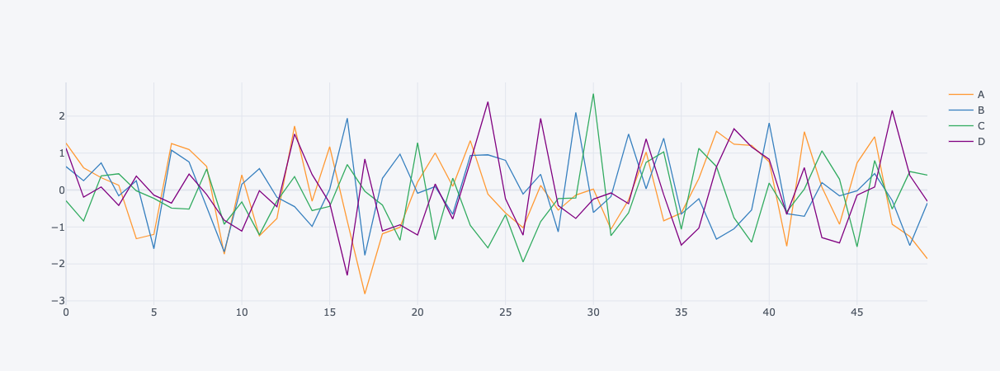

In [3]:
arr1 = np.random.randn(50, 4)
df1 = pd.DataFrame(arr1, columns=list('ABCD'))
df1.head()
df1.iplot()

## Line Plots

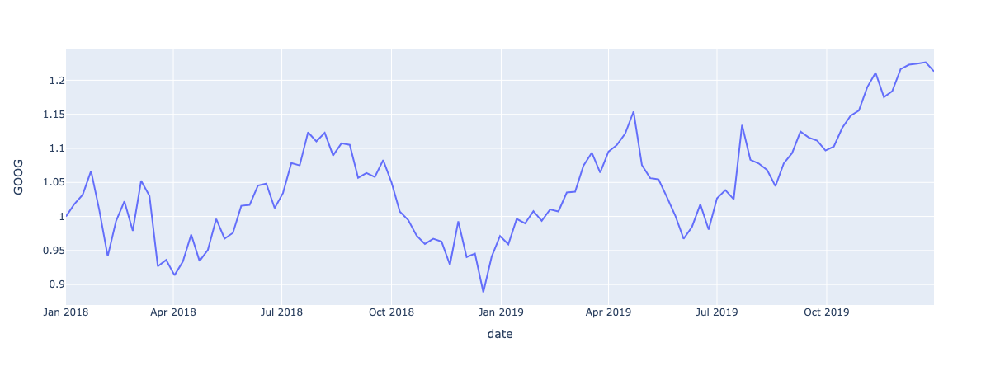

In [10]:
import plotly.graph_objects as go
df_stocks = px.data.stocks()
px.line(df_stocks, x='date', y='GOOG', labels=dict(x='Date', y='Price'))

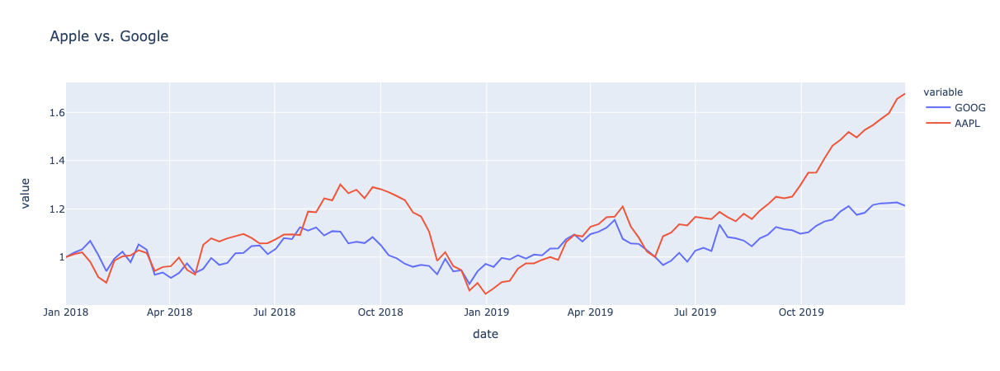

In [9]:
px.line(df_stocks, x='date', y=['GOOG', 'AAPL'], labels=dict(x='Date', y='Price'), title='Apple vs. Google')

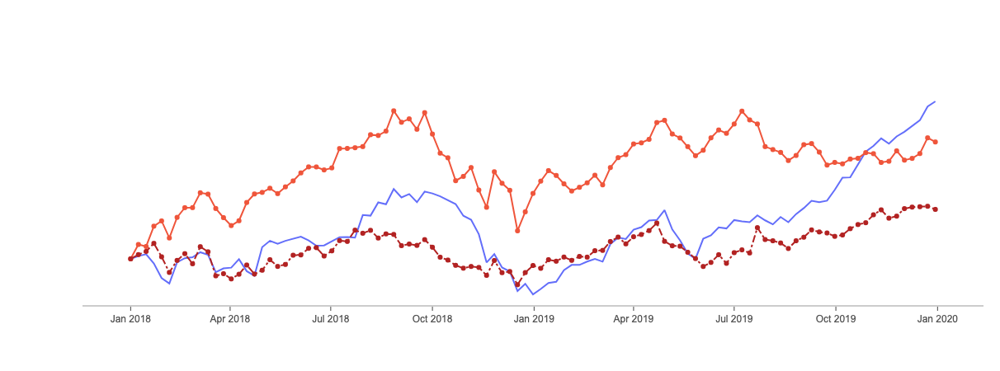

In [13]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=df_stocks.date, y=df_stocks.AAPL, mode='lines', name='Apple'))
fig.add_trace(go.Scatter(x=df_stocks.date, y=df_stocks.AMZN, mode='lines+markers', name='Amazon'))
fig.add_trace(go.Scatter(x=df_stocks.date, y=df_stocks.GOOG, mode='lines+markers', name='Google', line=dict(color='firebrick', width=2, dash='dashdot')))

# fig.update_layout(title='Stock Price Data 2018 - 2020', xaxis_title='Price', yaxis_title='Date')
fig.update_layout(xaxis=dict(showline=True, showgrid=False, showticklabels=True, 
                             linecolor='rgb(204,204,204)', linewidth=2, ticks='outside', tickfont=dict(family='Arial', size=12, color='rgb(82, 82, 82)')),
                 yaxis=dict(showgrid=False, zeroline=False, showline=False, showticklabels=False),
                 autosize=False, margin=dict(autoexpand=False, l=100, r=20, t=110),
                 showlegend=False, plot_bgcolor='white')

## Bar charts

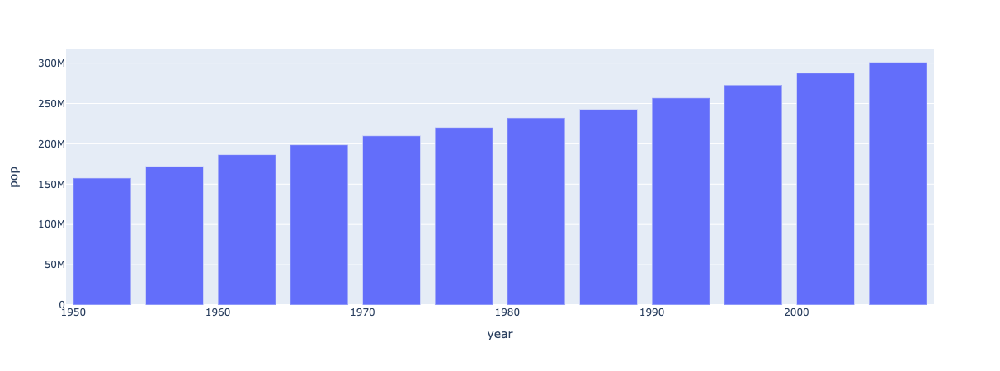

In [18]:
df_us = px.data.gapminder().query('country == "United States"')
px.bar(df_us, x='year', y='pop')

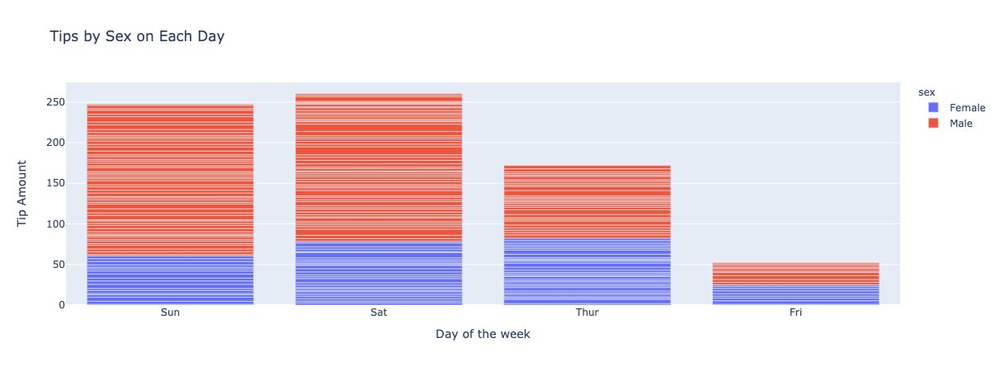

In [19]:
df_tips = px.data.tips()
px.bar(df_tips, x='day', y='tip', color='sex', title='Tips by Sex on Each Day',
      labels=dict(tip= 'Tip Amount', day='Day of the week'))

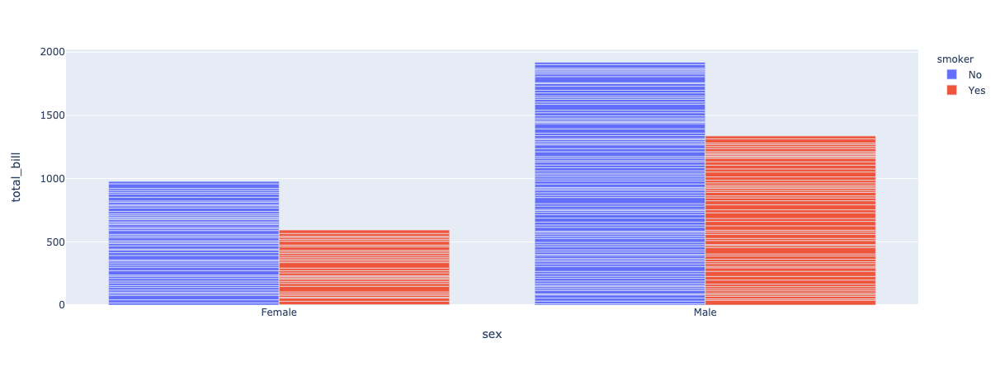

In [20]:
px.bar(df_tips, x='sex', y='total_bill', color='smoker', barmode='group')

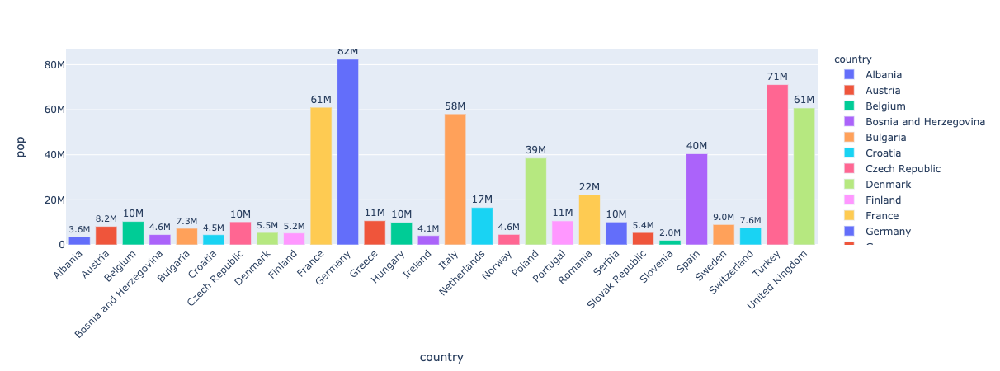

In [25]:
df_europe = px.data.gapminder().query('continent == "Europe" and year == 2007 and pop > 2.e6')
fig = px.bar(df_europe, y='pop', x='country', text='pop', color='country')
fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
fig.update_layout(uniformtext_minsize=8, xaxis_tickangle=-45)
fig

## Scatter plots

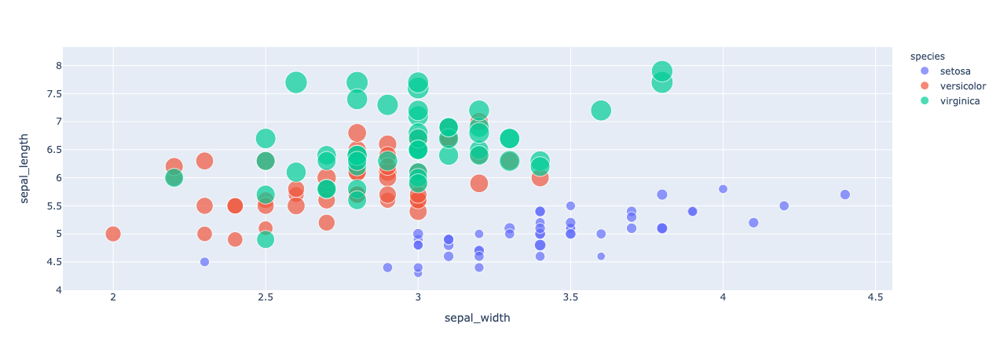

In [28]:
df_iris = px.data.iris()
px.scatter(df_iris, x='sepal_width', y='sepal_length', color='species', size='petal_length', hover_data=['petal_width'])

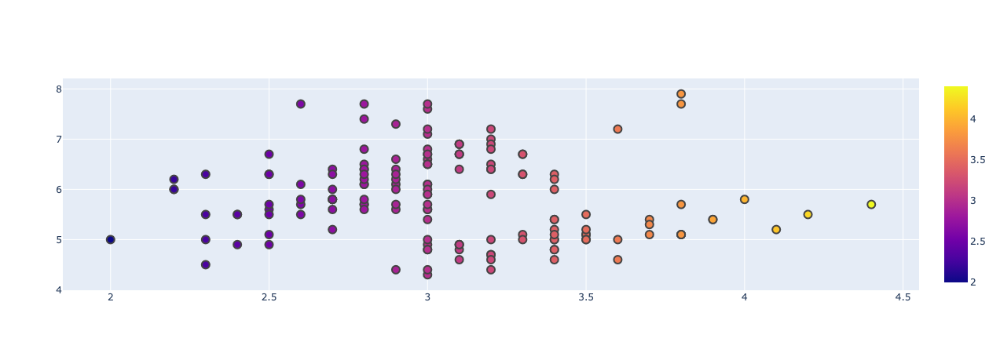

In [29]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=df_iris.sepal_width, y=df_iris.sepal_length, mode='markers', 
                         marker_color=df_iris.sepal_width, text=df_iris.species, marker=dict(showscale=True)))
fig.update_traces(marker_line_width=2, marker_size=10)

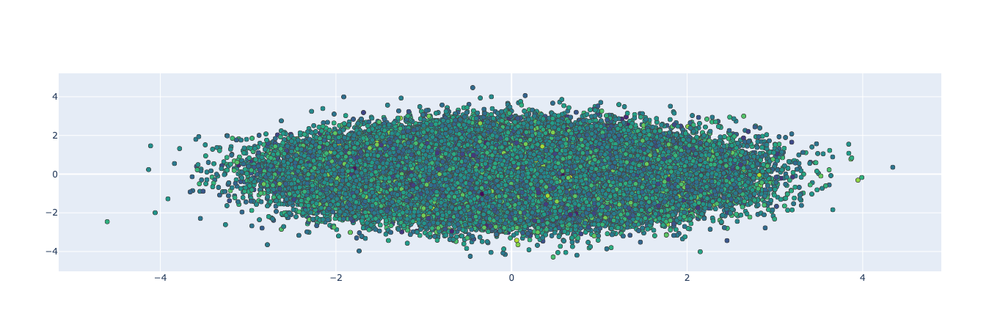

In [31]:
fig = go.Figure(data=go.Scattergl(x=np.random.randn(100000), y=np.random.randn(100000), mode='markers',
                                 marker=dict(color=np.random.randn(100000), colorscale='Viridis', line_width=1)))
fig

## Pie Charts

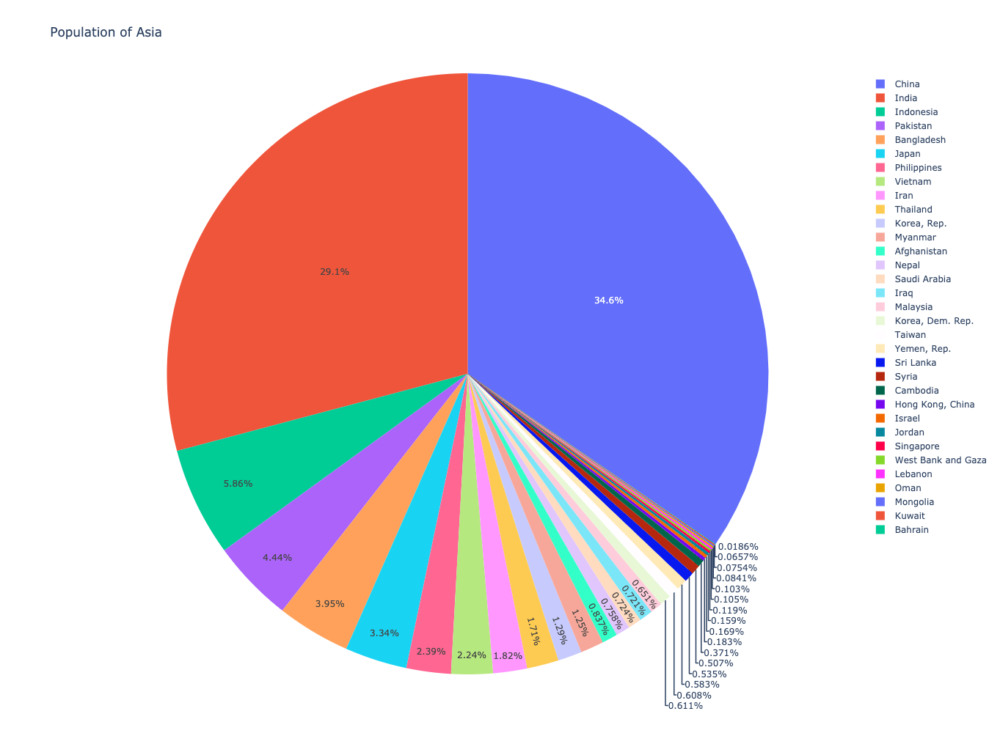

In [35]:
df_asia = px.data.gapminder().query('year == 2007').query('continent == "Asia"')
px.pie(df_asia, values='pop', names='country', title='Population of Asia', color_discrete_sequence=px.colors.sequential.RdBu, width=1000, height=1000)

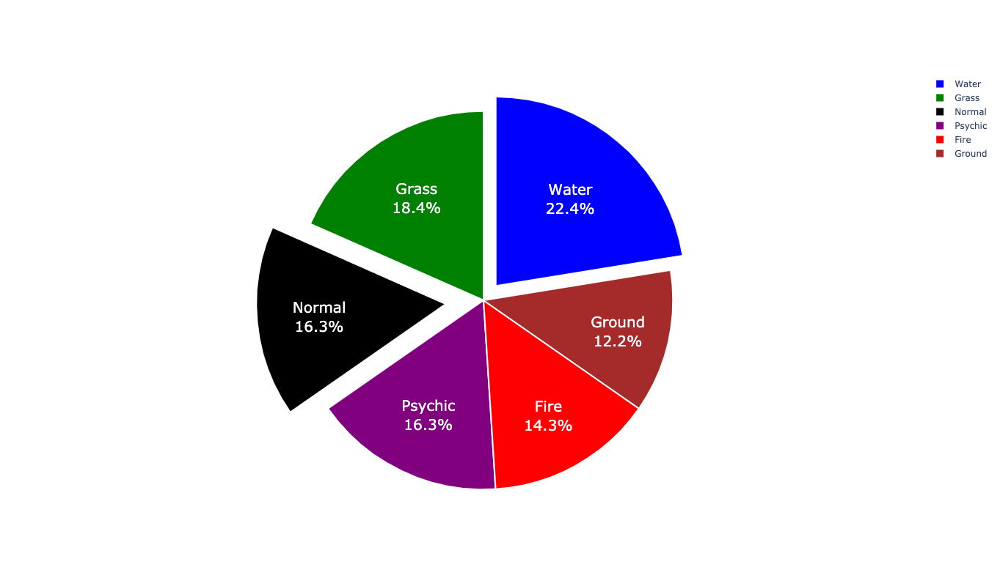

In [48]:
colors = ['blue', 'green', 'black', 'purple', 'red', 'brown']
fig = go.Figure(data=[go.Pie(labels=['Water', 'Grass', 'Normal', 'Psychic', 'Fire', 'Ground'], values=[110, 90, 80, 80, 70, 60])], layout=go.Layout(width=800, height=800))
fig.update_traces(hoverinfo='label+percent', textfont_size=20, textinfo='label+percent', pull=[0.1, 0, 0.2, 0, 0, 0],
                 marker=dict(colors=colors, line=dict(color='#ffffff', width=2)))

## Histogram

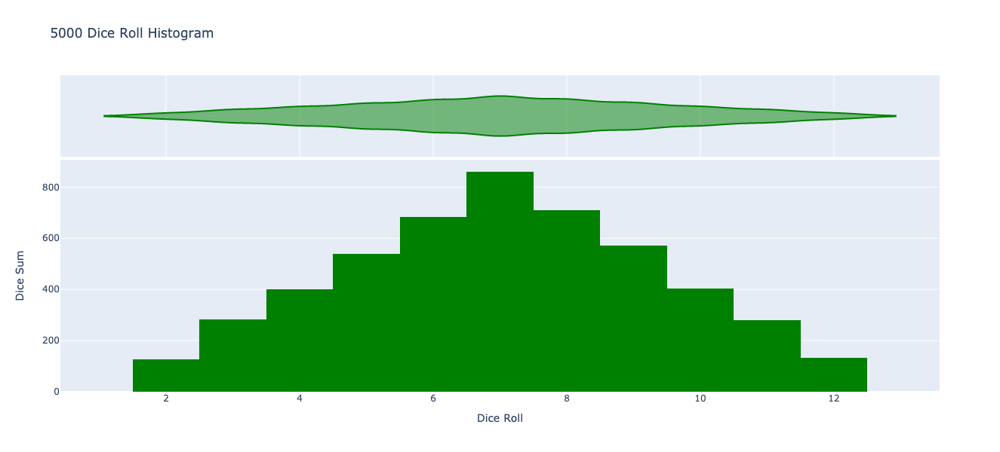

In [56]:
dice1 = np.random.randint(1,7,5000)
dice2 = np.random.randint(1,7,5000)
dice_sum = dice1 + dice2
fig = px.histogram(dice_sum, nbins=11, labels={'value': 'Dice Roll'}, title='5000 Dice Roll Histogram', 
                   marginal='violin', color_discrete_sequence=['green'], width=1000, height=800)
fig.update_layout(xaxis_title_text='Dice Roll', yaxis_title_text='Dice Sum', width=800, height=600,
                 showlegend=False, bargap=0)
fig